In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

In [107]:
df = pd.read_csv("./parkinsons.csv")

In [108]:
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [109]:
df.tail()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306
194,phon_R01_S50_6,214.289,260.277,77.973,0.00567,0.00003,0.00295,0.00317,0.00885,0.01884,...,0.03078,0.04398,21.209,0,0.462803,0.664357,-5.724056,0.190667,2.555477,0.148569


In [110]:
df.shape

(195, 24)

This dataset contain 195 rows and 24 columns.

In [111]:
df.replace({'status' : {1 : 'P', 0 : 'N'}}, inplace = True)
df['status'].value_counts()

P    147
N     48
Name: status, dtype: int64

In [112]:
print("All features :")
print(list(df.columns))
num = list(df._get_numeric_data())
print("\nNumeric features :")
print(num)
cat = list(set(df.columns) - set(df._get_numeric_data()))
print("\n Categorical features :")
print(cat)

All features :
['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)', 'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP', 'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA', 'spread1', 'spread2', 'D2', 'PPE']

Numeric features :
['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)', 'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP', 'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'spread1', 'spread2', 'D2', 'PPE']

 Categorical features :
['status', 'name']


#### Attribute Information:

name - ASCII subject name and recording number

MDVP:Fo(Hz) - Average vocal fundamental frequency

MDVP:Fhi(Hz) - Maximum vocal fundamental frequency

MDVP:Flo(Hz) - Minimum vocal fundamental frequency

MDVP:Jitter(%) , MDVP:Jitter(Abs) , MDVP:RAP , MDVP:PPQ , Jitter:DDP - Several measures of variation in fundamental frequency

MDVP:Shimmer , MDVP:Shimmer(dB) , Shimmer:APQ3 , Shimmer:APQ5 , MDVP:APQ , Shimmer:DDA - Several measures of variation in amplitude

NHR , HNR - Two measures of ratio of noise to tonal components in the voice

status - Health status of the subject (P) - Parkinson's, (N) - healthy

RPDE , D2 - Two nonlinear dynamical complexity measures

DFA - Signal fractal scaling exponent

spread1 , spread2 , PPE - Three nonlinear measures of fundamental frequency variation

In [113]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [114]:
df.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.024081,0.046993,0.024847,21.885974,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.016947,0.030459,0.040418,4.425764,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.007190,0.013640,0.000650,8.441000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.013080,0.024735,0.005925,19.198000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.018260,0.038360,0.011660,22.085000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.029400,0.060795,0.025640,25.075500,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.137780,0.169420,0.314820,33.047000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


# Dealing with duplicate values.

In [115]:
df.duplicated().sum()

0

This dataset doesn't contain any duplicate values.

# Dealing with null values.

In [116]:
df.isnull().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

This dataset doesn't contain any null values.

# Dealing with outliers.

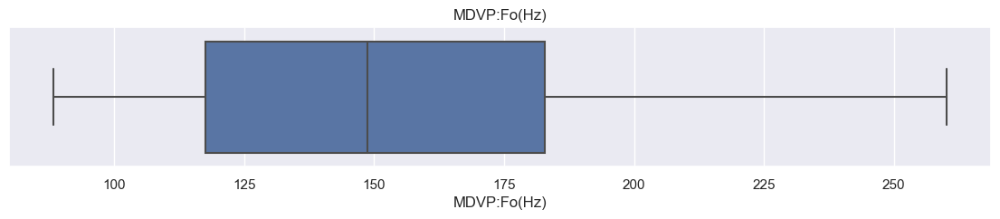

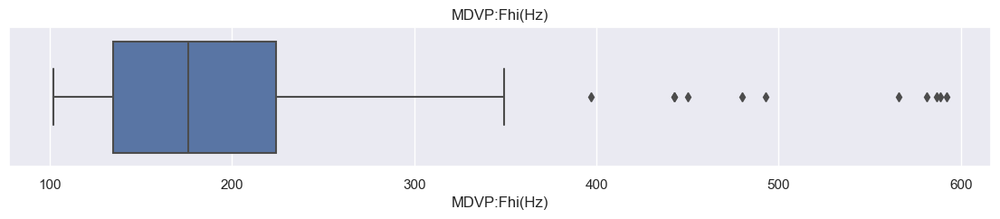

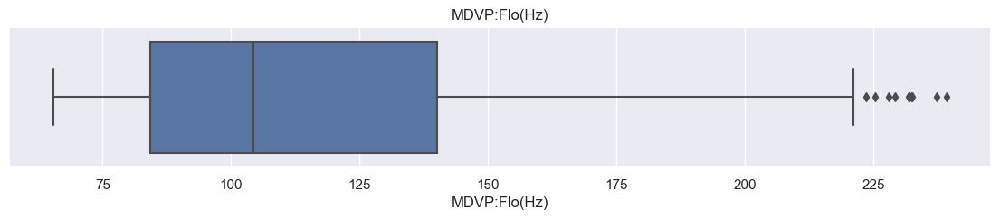

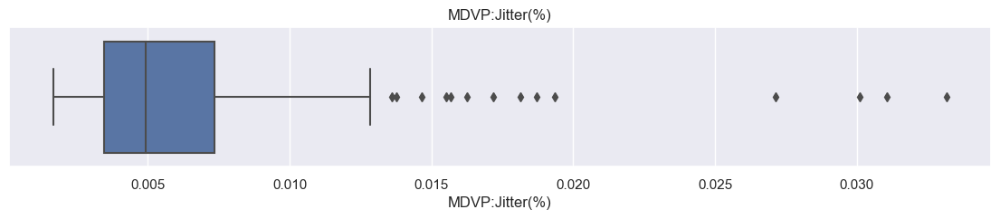

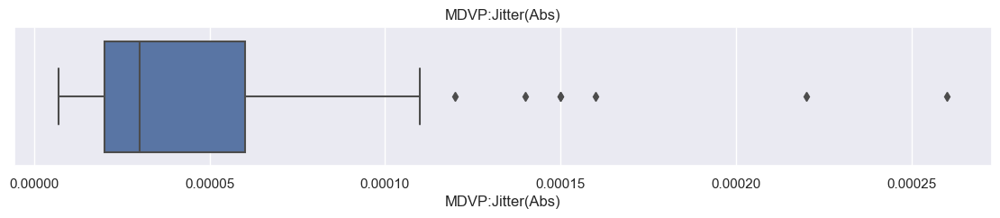

...

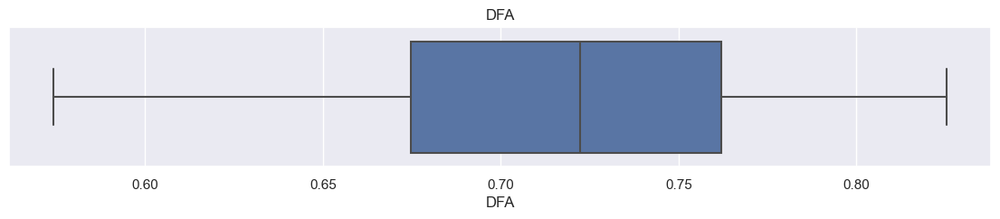

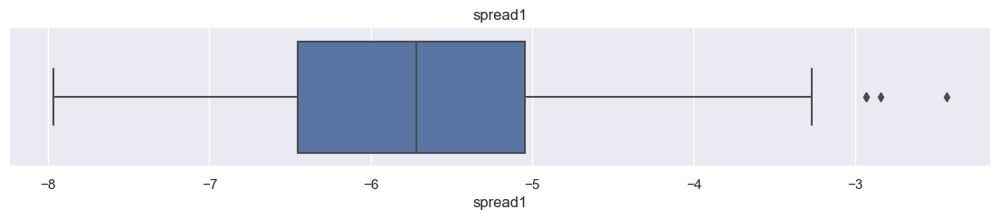

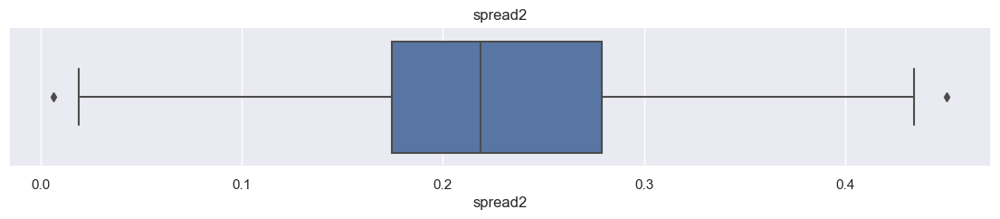

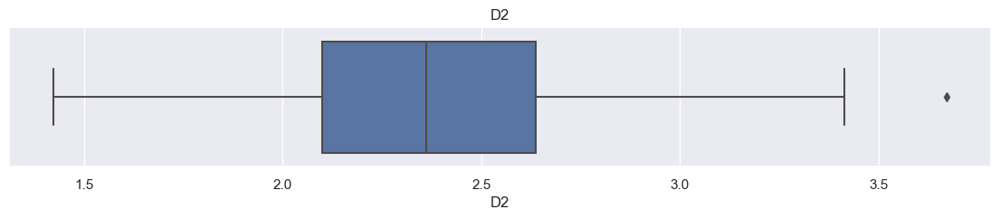

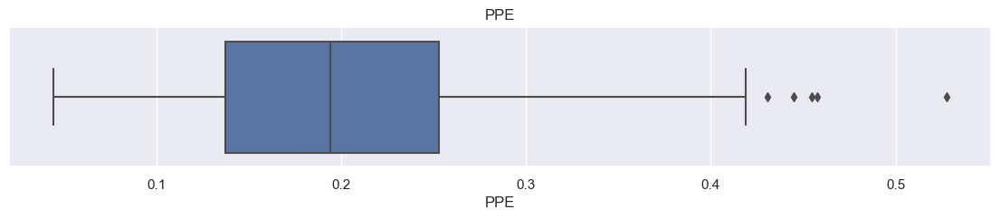

In [117]:
for i in num:
    sns.set()
    plt.figure(figsize =(14, 2))
    sns.boxplot(df[i])
    plt.title(i)
    plt.show()

In [118]:
num = list(set(num) - set('status'))

for i in num:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    IQR = q3 - q1
    lower_threshold = q1 - (1.5 * IQR)
    upper_threshold = q3 + (1.5 * IQR)
    df.loc[(df[i] <= lower_threshold), i] = lower_threshold
    df.loc[(df[i] >= upper_threshold), i] = upper_threshold

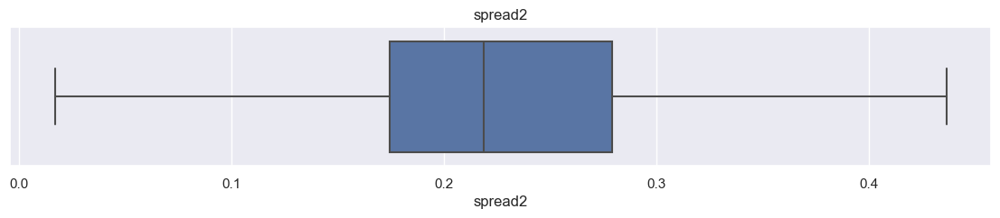

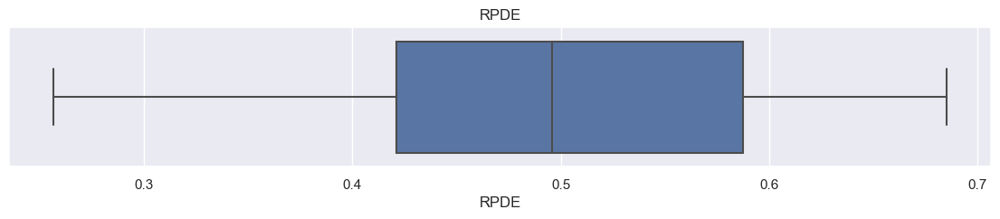

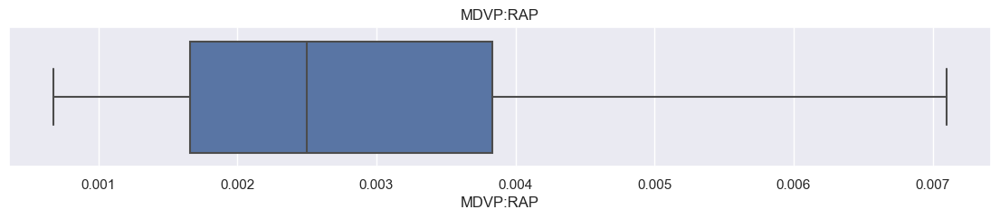

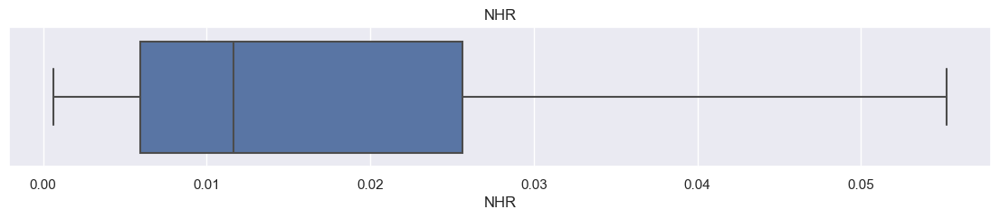

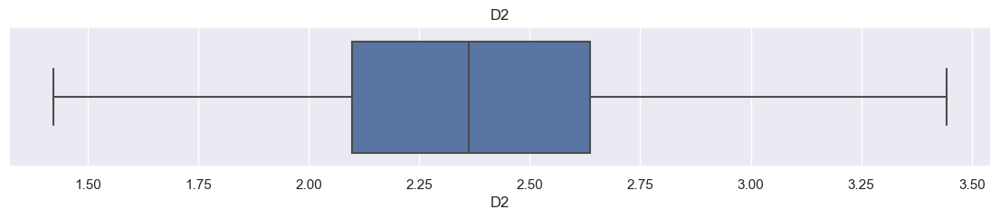

...

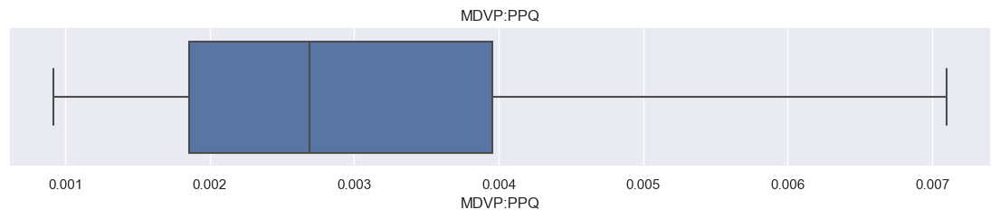

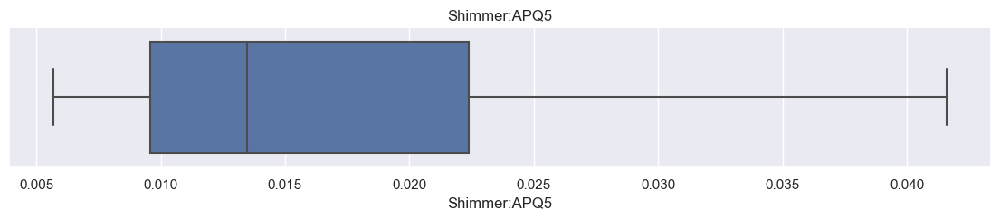

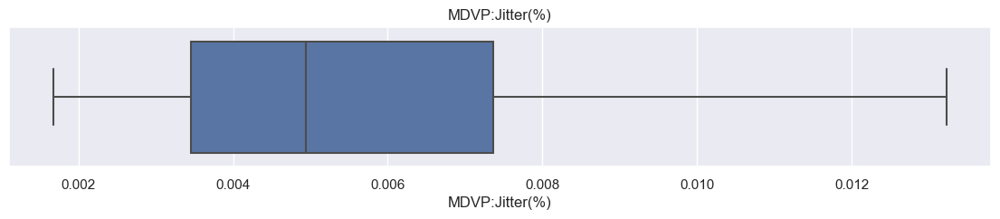

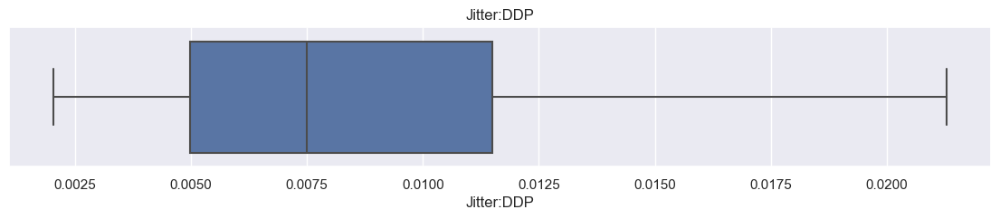

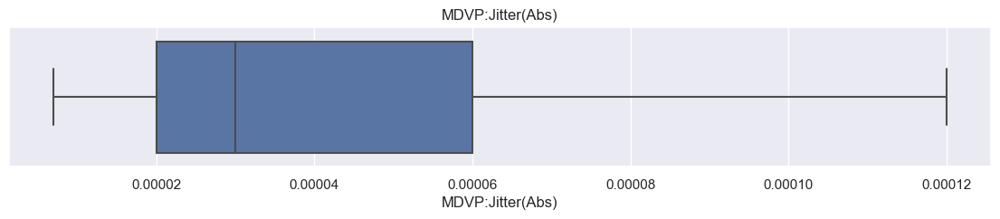

In [119]:
num = list(set(num) - set('status'))

for i in num:
    sns.set()
    plt.figure(figsize =(14, 2))
    sns.boxplot(x = i, data = df)
    plt.title(i)
    plt.show()

<Figure size 1500x1500 with 0 Axes>

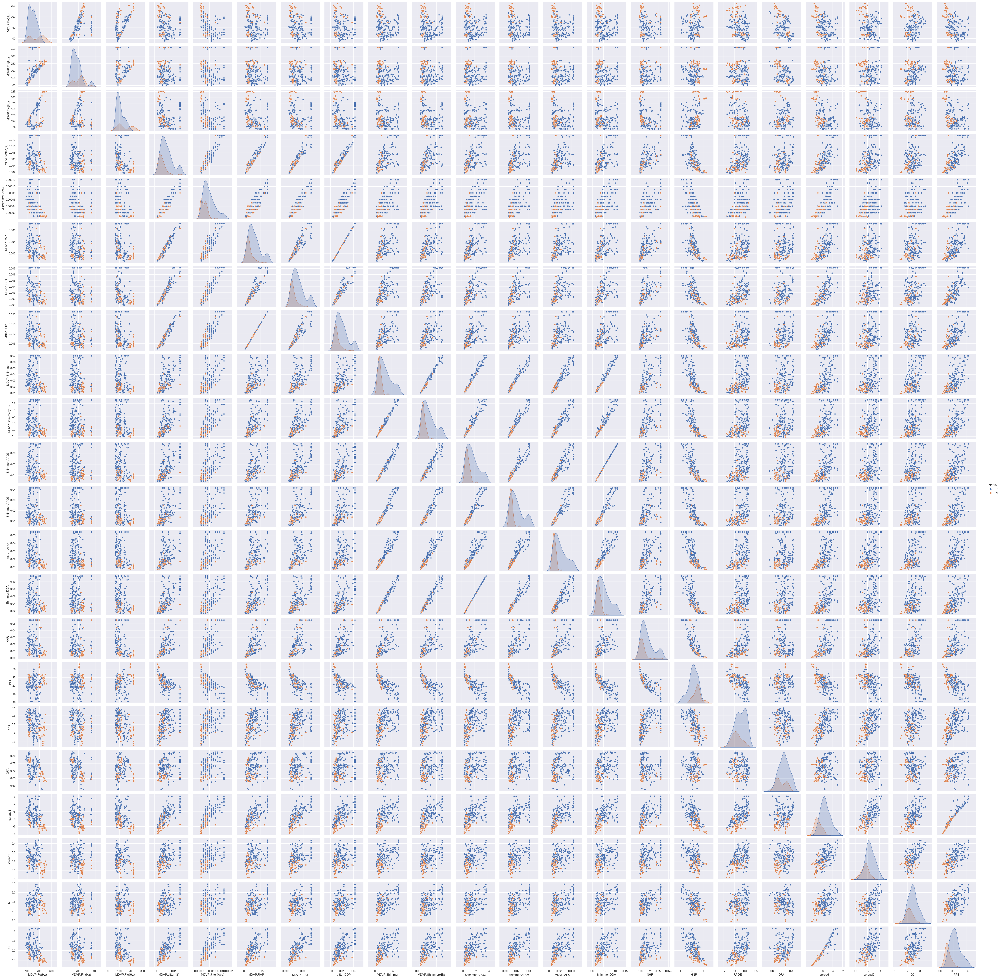

In [94]:
sns.set()
plt.figure(figsize = (15, 15))
sns.pairplot(data = df, hue = 'status')
plt.show()

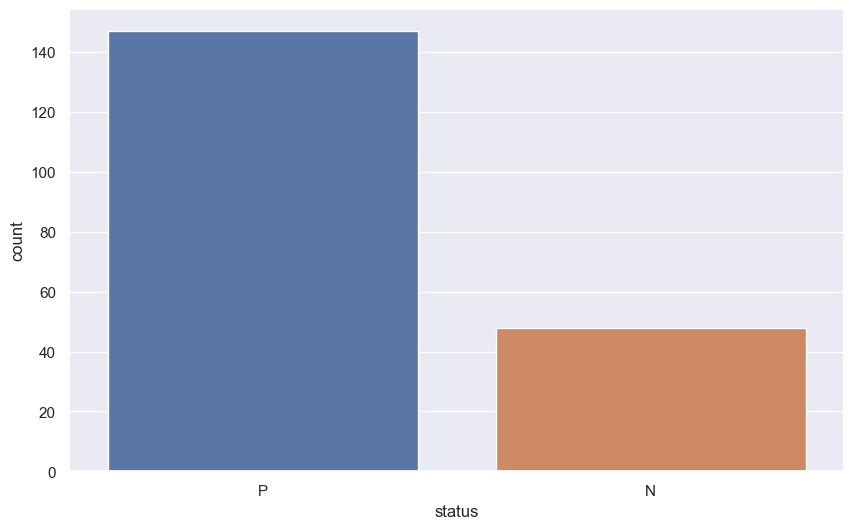

In [120]:
sns.set()
plt.figure(figsize = (10, 6))
sns.countplot(x = 'status', data = df)
plt.show()

In [125]:
df.drop(columns = 'name', axis = 1, inplace = True)

# Split data

In [147]:
x = df.drop(columns = 'status', axis = 1)
y = df['status']

In [148]:
print(x.shape)
x.head()

(195, 22)


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.005540,0.01109,0.04374,0.426,...,0.02971,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.006960,0.01394,0.06134,0.626,...,0.04368,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.007098,0.01633,0.05233,0.482,...,0.03590,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.006980,0.01505,0.05492,0.517,...,0.03772,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.007098,0.01966,0.06425,0.584,...,0.04465,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [149]:
print(y.shape)
y.head()

(195,)


0    P
1    P
2    P
3    P
4    P
Name: status, dtype: object

# Scaling data

In [150]:
sc = StandardScaler()
sc.fit(x)

StandardScaler()

In [151]:
x1 = sc.transform(x)
x = pd.DataFrame(data = x1, columns = x.columns, index = x.index)

In [152]:
x.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
0,-0.829300,-0.500094,-0.964110,0.701875,1.017692,0.440015,1.437914,0.438206,0.885615,0.976347,...,0.518684,0.710297,0.236191,-0.201203,-0.807838,1.760814,0.810831,0.482584,-0.209449,0.906632
1,-0.770972,-0.638805,-0.050885,1.308591,1.382624,0.999991,2.285930,0.998426,1.943849,2.235504,...,1.594294,1.755272,0.063834,-0.648894,-0.387524,1.837562,1.494886,1.316596,0.280817,1.870326
2,-0.909476,-0.919993,-0.104142,1.578975,1.747556,1.465655,2.368044,1.468224,1.402105,1.328911,...,0.995279,1.341012,-0.315105,-0.288994,-0.662075,1.942048,1.153723,1.021926,-0.101522,1.456953
3,-0.909622,-0.811616,-0.108588,1.404215,1.747556,1.218086,2.297874,1.216617,1.557834,1.549263,...,1.135408,1.524193,-0.288212,-0.290603,-0.613134,1.832380,1.455661,1.299181,0.065842,1.873778
4,-0.925657,-0.748930,-0.125313,2.350560,2.477420,2.119942,2.368044,2.122797,2.118818,1.971081,...,1.668978,2.145401,-0.035179,-0.519275,-0.783021,1.909364,1.798426,0.096775,-0.128172,2.348170


In [153]:
x.std()

MDVP:Fo(Hz)         1.002574
MDVP:Fhi(Hz)        1.002574
MDVP:Flo(Hz)        1.002574
MDVP:Jitter(%)      1.002574
MDVP:Jitter(Abs)    1.002574
MDVP:RAP            1.002574
MDVP:PPQ            1.002574
Jitter:DDP          1.002574
MDVP:Shimmer        1.002574
MDVP:Shimmer(dB)    1.002574
Shimmer:APQ3        1.002574
Shimmer:APQ5        1.002574
MDVP:APQ            1.002574
Shimmer:DDA         1.002574
NHR                 1.002574
HNR                 1.002574
RPDE                1.002574
DFA                 1.002574
spread1             1.002574
spread2             1.002574
D2                  1.002574
PPE                 1.002574
dtype: float64

# Correlation of data 

<AxesSubplot:>

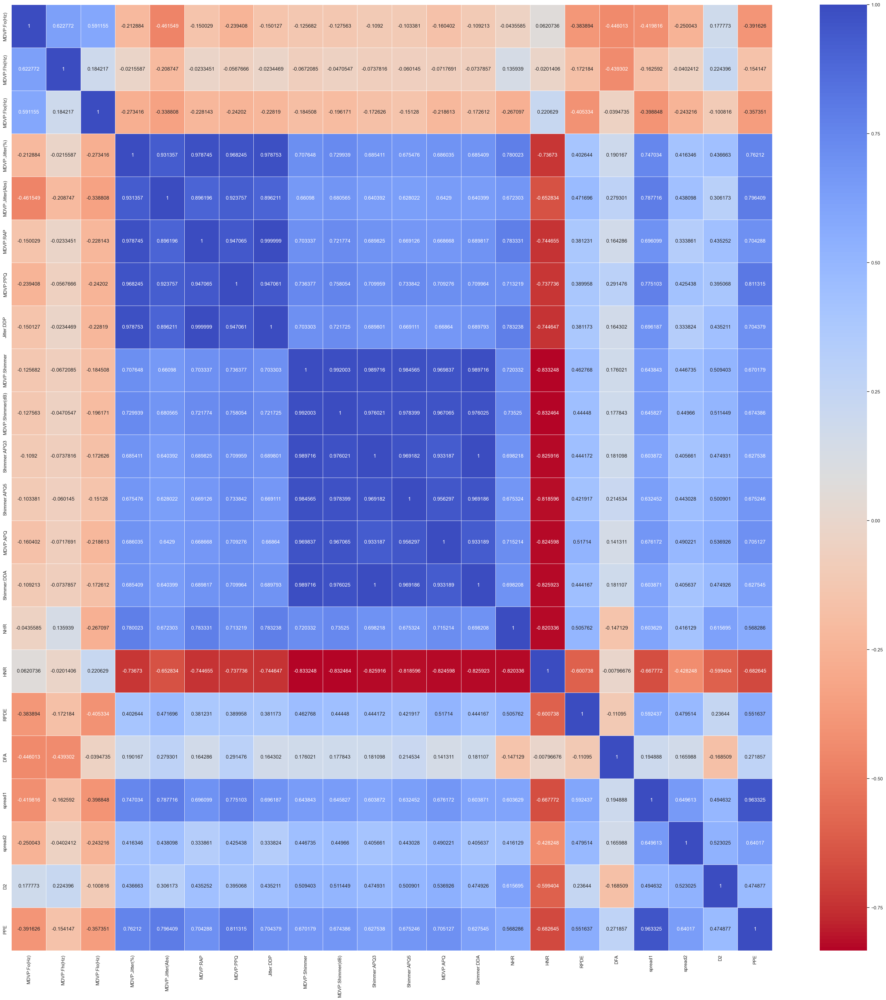

In [135]:
sns.set()
plt.figure(figsize = (40, 40))
sns.heatmap(x.corr(), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

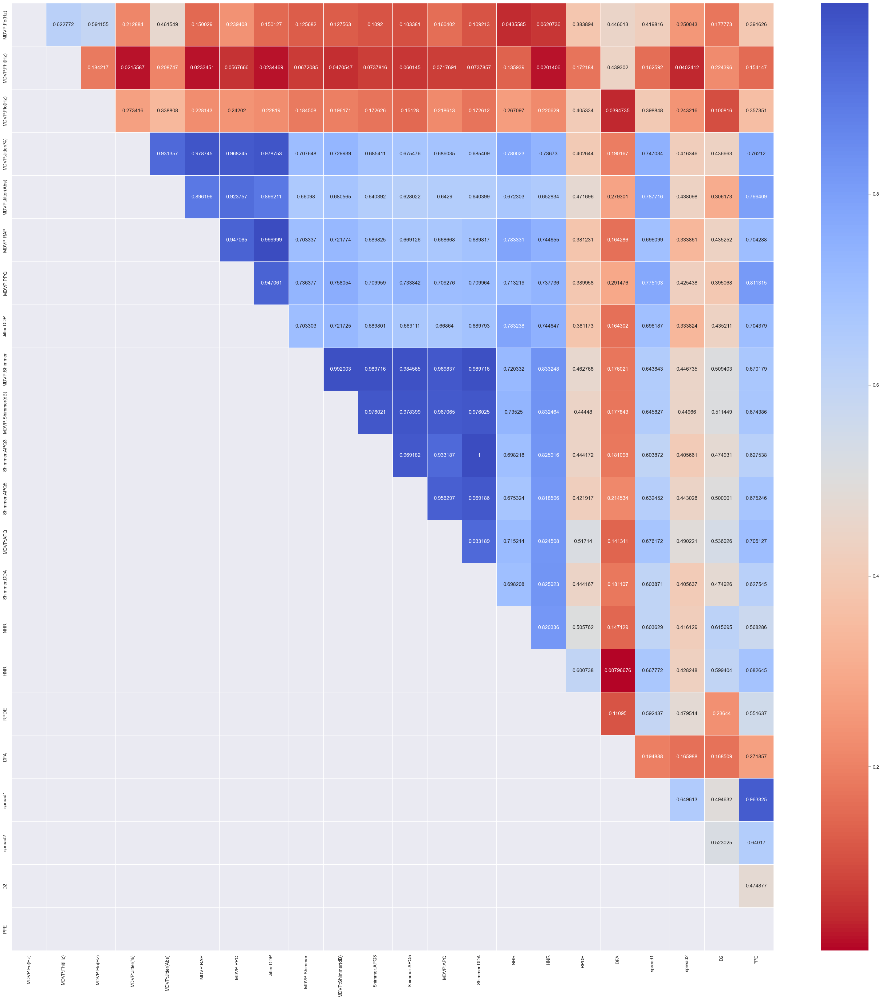

In [157]:
corr = df.corr().abs()

upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))

sns.set()
plt.figure(figsize = (40, 40))
sns.heatmap(upper, annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

In [158]:
to_drop = list(column for column in upper.columns if any(upper[column] > 0.95))

to_drop

['MDVP:RAP',
 'MDVP:PPQ',
 'Jitter:DDP',
 'MDVP:Shimmer(dB)',
 'Shimmer:APQ3',
 'Shimmer:APQ5',
 'MDVP:APQ',
 'Shimmer:DDA',
 'PPE']

In [159]:
x.drop(columns = to_drop, axis=1)
print(x.shape)
x.head()

(195, 22)


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
0,-0.829300,-0.500094,-0.964110,0.701875,1.017692,0.440015,1.437914,0.438206,0.885615,0.976347,...,0.518684,0.710297,0.236191,-0.201203,-0.807838,1.760814,0.810831,0.482584,-0.209449,0.906632
1,-0.770972,-0.638805,-0.050885,1.308591,1.382624,0.999991,2.285930,0.998426,1.943849,2.235504,...,1.594294,1.755272,0.063834,-0.648894,-0.387524,1.837562,1.494886,1.316596,0.280817,1.870326
2,-0.909476,-0.919993,-0.104142,1.578975,1.747556,1.465655,2.368044,1.468224,1.402105,1.328911,...,0.995279,1.341012,-0.315105,-0.288994,-0.662075,1.942048,1.153723,1.021926,-0.101522,1.456953
3,-0.909622,-0.811616,-0.108588,1.404215,1.747556,1.218086,2.297874,1.216617,1.557834,1.549263,...,1.135408,1.524193,-0.288212,-0.290603,-0.613134,1.832380,1.455661,1.299181,0.065842,1.873778
4,-0.925657,-0.748930,-0.125313,2.350560,2.477420,2.119942,2.368044,2.122797,2.118818,1.971081,...,1.668978,2.145401,-0.035179,-0.519275,-0.783021,1.909364,1.798426,0.096775,-0.128172,2.348170


# Model building

## LogisticRegression

In [160]:
param_grid = {'penalty' : ['l1', 'l2', 'elasticnet', None],
              'C': [0.001, 0.01, 1],
                'fit_intercept': [True, False]
             }

In [162]:
lgr = LogisticRegression()
lgr_gsc = GridSearchCV(lgr, param_grid, cv = 5)
lgr_gsc.fit(x, y)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 1], 'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2', 'elasticnet', None]})

In [166]:
print("Best parameters for Logistic Regression : ",lgr_gsc.best_params_)

Best parameters for Logistic Regression :  {'C': 0.01, 'fit_intercept': True, 'penalty': 'l2'}


In [167]:
print("Score for best parameters : ",lgr_gsc.best_score_)

Score for best parameters :  0.8461538461538461


In [190]:
lgr_y_pred = lgr_gsc.predict(x)

In [191]:
print("classification report :")
print(classification_report(y, lgr_y_pred))

classification report :
              precision    recall  f1-score   support

           N       0.85      0.46      0.59        48
           P       0.85      0.97      0.91       147

    accuracy                           0.85       195
   macro avg       0.85      0.72      0.75       195
weighted avg       0.85      0.85      0.83       195



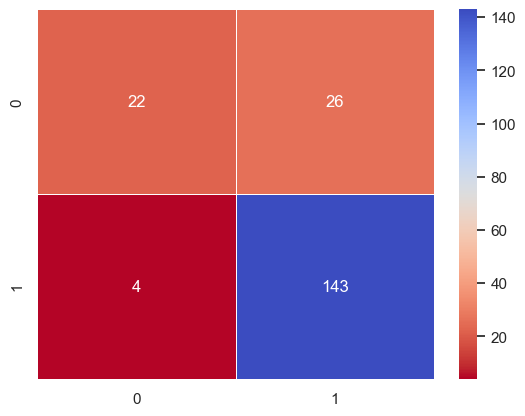

In [192]:
sns.set()
sns.heatmap(confusion_matrix(y, lgr_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

## KNeighborsClassifier

In [180]:
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'], 
    'p': [1, 2] 
}

In [198]:
knn = KNeighborsClassifier()
knn_gsc = GridSearchCV(knn, param_grid, cv = 10)
knn_gsc.fit(x, y)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7], 'p': [1, 2],
                         'weights': ['uniform', 'distance']})

In [199]:
print("Best parameters for K-Neighbors Classifier : ",knn_gsc.best_params_)

Best parameters for K-Neighbors Classifier :  {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}


In [200]:
print("Score for best parameters : ",knn_gsc.best_score_)

Score for best parameters :  0.8605263157894736


In [201]:
knn_y_pred = knn_gsc.predict(x)

In [202]:
print("classification report :")
print(classification_report(y, knn_y_pred))

classification report :
              precision    recall  f1-score   support

           N       1.00      1.00      1.00        48
           P       1.00      1.00      1.00       147

    accuracy                           1.00       195
   macro avg       1.00      1.00      1.00       195
weighted avg       1.00      1.00      1.00       195



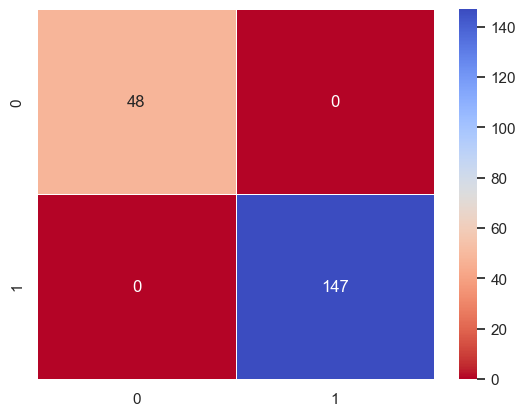

In [203]:
sns.set()
sns.heatmap(confusion_matrix(y, knn_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

## DecisionTreeClassifier

In [204]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
}

In [205]:
dtc = DecisionTreeClassifier()
dtc_gsc = GridSearchCV(dtc, param_grid, cv = 5)
dtc_gsc.fit(x, y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10],
                         'min_samples_split': [2, 5, 10]})

Best parameters for DecisionTree Classifier :  {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 10}

 Score for best parameters :  0.7538461538461538

 classification report :
              precision    recall  f1-score   support

           N       0.96      0.98      0.97        48
           P       0.99      0.99      0.99       147

    accuracy                           0.98       195
   macro avg       0.98      0.98      0.98       195
weighted avg       0.98      0.98      0.98       195



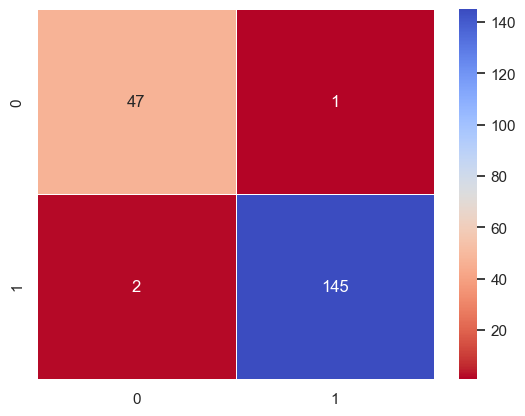

In [207]:
print("Best parameters for DecisionTree Classifier : ",dtc_gsc.best_params_)
print("\n Score for best parameters : ",dtc_gsc.best_score_)

dtc_y_pred = dtc_gsc.predict(x)

print("\n classification report :")
print(classification_report(y, dtc_y_pred))

sns.set()
sns.heatmap(confusion_matrix(y, dtc_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

## RandomForestClassifier

In [208]:
param_grid = {
    'n_estimators': [100, 200, 500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}

In [209]:
rfc = RandomForestClassifier()
rfc_gsc = GridSearchCV(rfc, param_grid, cv = 5)
rfc_gsc.fit(x, y)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 200, 500]})

Best parameters for RandomForest Classifier :  {'criterion': 'entropy', 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 500}

 Score for best parameters :  0.8102564102564103

 classification report :
              precision    recall  f1-score   support

           N       1.00      1.00      1.00        48
           P       1.00      1.00      1.00       147

    accuracy                           1.00       195
   macro avg       1.00      1.00      1.00       195
weighted avg       1.00      1.00      1.00       195



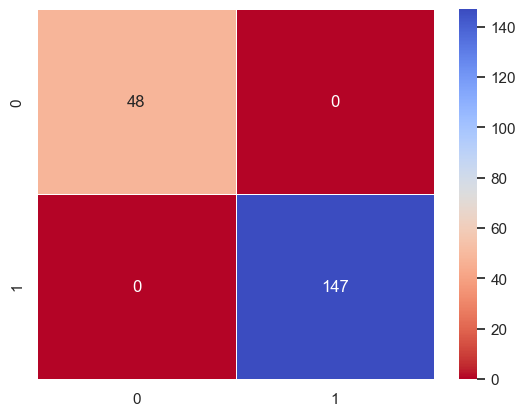

In [210]:
print("Best parameters for RandomForest Classifier : ", rfc_gsc.best_params_)
print("\n Score for best parameters : ", rfc_gsc.best_score_)

rfc_y_pred = rfc_gsc.predict(x)

print("\n classification report :")
print(classification_report(y, rfc_y_pred))

sns.set()
sns.heatmap(confusion_matrix(y, rfc_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

## BernoulliNB

In [211]:
param_grid = {
    'alpha': [0.1, 0.5, 1.0], 
    'binarize': [0.0, 0.5, 1.0], 
    'fit_prior': [True, False]  
}

In [212]:
bnb = BernoulliNB()
bnb_gsc = GridSearchCV(bnb, param_grid, cv = 5)
bnb_gsc.fit(x, y)

GridSearchCV(cv=5, estimator=BernoulliNB(),
             param_grid={'alpha': [0.1, 0.5, 1.0], 'binarize': [0.0, 0.5, 1.0],
                         'fit_prior': [True, False]})

Best parameters for BernoulliNB :  {'alpha': 0.1, 'binarize': 0.0, 'fit_prior': True}

 Score for best parameters :  0.7282051282051282

 classification report :
              precision    recall  f1-score   support

           N       0.48      0.85      0.61        48
           P       0.94      0.69      0.80       147

    accuracy                           0.73       195
   macro avg       0.71      0.77      0.70       195
weighted avg       0.82      0.73      0.75       195



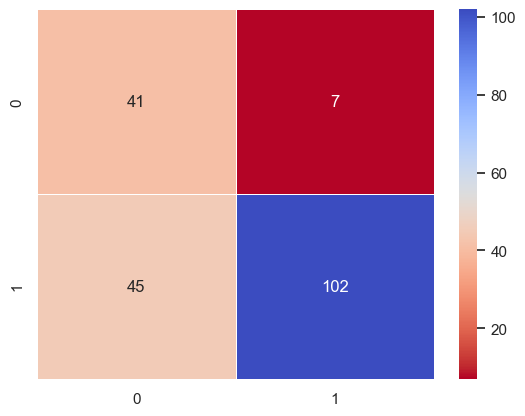

In [213]:
print("Best parameters for BernoulliNB : ", bnb_gsc.best_params_)
print("\n Score for best parameters : ", bnb_gsc.best_score_)

bnb_y_pred = bnb_gsc.predict(x)

print("\n classification report :")
print(classification_report(y, bnb_y_pred))

sns.set()
sns.heatmap(confusion_matrix(y, bnb_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()

## Support Vector Classifier (SVC)

In [214]:
param_grid = {
    'C': [0.1, 1.0, 10.0],  
    'kernel': ['linear', 'rbf', 'poly'], 
    'gamma': ['scale', 'auto'], 
    'degree': [2, 3, 4] 
}

In [215]:
svc = SVC()
svc_gsc = GridSearchCV(svc, param_grid, cv = 5)
svc_gsc.fit(x, y)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1.0, 10.0], 'degree': [2, 3, 4],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']})

Best parameters for Support Vector Classifier :  {'C': 1.0, 'degree': 3, 'gamma': 'auto', 'kernel': 'poly'}

 Score for best parameters :  0.8410256410256409

 classification report :
              precision    recall  f1-score   support

           N       1.00      0.54      0.70        48
           P       0.87      1.00      0.93       147

    accuracy                           0.89       195
   macro avg       0.93      0.77      0.82       195
weighted avg       0.90      0.89      0.87       195



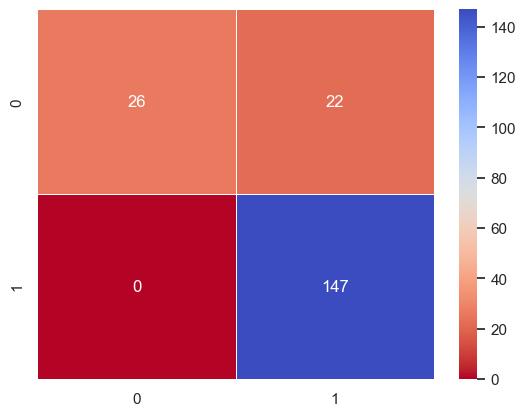

In [216]:
print("Best parameters for Support Vector Classifier : ", svc_gsc.best_params_)
print("\n Score for best parameters : ", svc_gsc.best_score_)

svc_y_pred = svc_gsc.predict(x)

print("\n classification report :")
print(classification_report(y, svc_y_pred))

sns.set()
sns.heatmap(confusion_matrix(y, svc_y_pred), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')
plt.show()